<a href="https://colab.research.google.com/github/prabal5ghosh/Deep-Learning-summer-school-2025-university-of-cote-d-Azur/blob/main/Lab_DLS_zero_few_shot_SUJET.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><img width=60% src="http://www.i3s.unice.fr/~lingrand/efeliaUnica.png"><br/><br/>
<font size=+3><b>Exploring zero-shot and few-shot adapatation with CLIP</b></font><br/><br/>
<font size=+1>Rémy Sun, Diane Lingrand and Frédéric Precioso<br/><br/>
    2025 - June/July</font><br/>
    </center>
    

This lab aims to familiarize you with the use of large pretrained for downstream tasks with no or minimal dedicated training for the task of interest
* In a first part we showcase to you how to use a pre-trained CLIP model to compare different images and snippets of text
* In a second part, we explore how this can be used to perform zero-shot classification (no training!) on the CIFAR10 dataset (or the CIFAR100 dataset if you are interested) along with different techniques to improve the results
* In a third part, we investigate what to do when a few labeled training examples are available for the task: this is called few-shot adaptation
* If you still want to work on similar problem, you can load up a SmolVLM model to perform more complex prompt manipulations and text generation.


# Preliminary setup

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu.

The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed. It will also check the compute device you are using and allow you to run computations on CPU if you want. Running on CPU is not recommended but possible for the first few exercises in this lab. You can reduce the dataset sizes if you really want to run on CPU.

In [1]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.1 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-wu1hrzg0
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-wu1hrzg0
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 108.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import numpy as np
import torch
from pkg_resources import packaging

import torchvision.transforms as transforms

from tqdm.notebook import tqdm

print("Torch version:", torch.__version__)


Torch version: 2.6.0+cu124


In [3]:
# making the code device agnostic
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
device

device(type='cuda')

# Showcasing the capabilities of CLIP

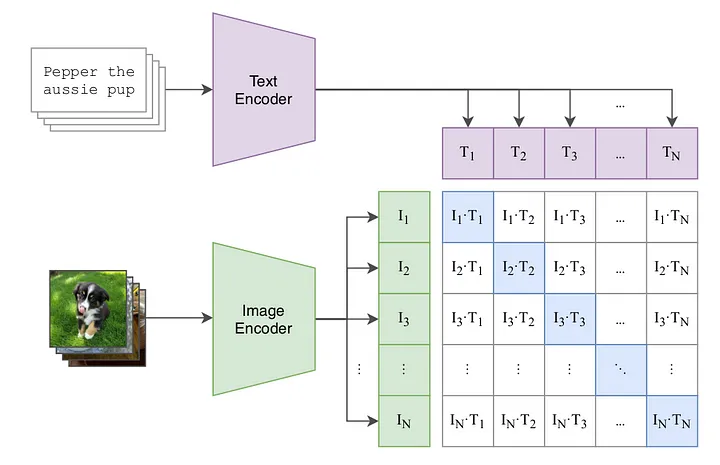

This first section will showcase how a pre-trained CLIP model can be used to embed texts and images, compare them and even perform classification on a few given images as can be seen in online tutorials such as [this one](https://huggingface.co/spaces/danurahul/gan/blob/main/CLIP/notebooks/Interacting_with_CLIP.ipynb).

Running `clip.available_models()` will list the names of available CLIP models.

In [4]:
import clip

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In the rest of this tutorial we will assume you run the standard ViT-B/32 model (understand "ViT of Base Size with 32x32 patches"). The following cell just load the model and sets up a few image transformation functions we are going to need.

In [5]:
model, preprocess = clip.load("ViT-B/32")

inv_normalize = transforms.Normalize(
    mean=[-0.481/0.269, -0.458/0.261, -0.408/0.276],
    std=[1/0.269, 1/0.261, 1/0.276]
)

model.to(device).eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

100%|███████████████████████████████████████| 338M/338M [00:10<00:00, 32.2MiB/s]


Model parameters: 151,277,313
Input resolution: 224
Context length: 77
Vocab size: 49408


CLIP's default preprocessing transform resizes the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, it normalizes the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [6]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7b8065fa1260>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [7]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

## Setting up input images and texts

We are going to feed 8 example images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [8]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Textual descriptions we are going to try to match with images
descriptions = [
    "a page of text about segmentation",
    "a portrait of an astronaut with the American flag",
    "a rocket standing on a launchpad",
    "a facial photo of a tabby cat",
    "a black-and-white silhouette of a horse",
    "a cup of coffee on a saucer",
    "a person looking at a camera on a tripod",
    "a red motorcycle standing in a garage",
]

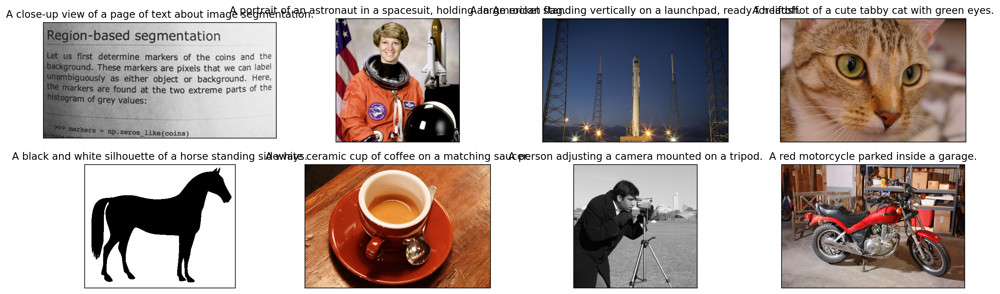

In [123]:
original_images = [
    Image.fromarray(skimage.data.page()).convert('RGB'),
    Image.fromarray(skimage.data.astronaut()),
    Image.fromarray(skimage.data.rocket()),
    Image.fromarray(skimage.data.chelsea()),
    Image.fromarray(skimage.data.horse()),
    Image.fromarray(skimage.data.coffee()),
    Image.fromarray(skimage.data.camera()).convert('RGB'),
    Image.fromarray(skimage.data.stereo_motorcycle()[0]),
    ]

images = []
texts = []
plt.figure(figsize=(16, 5))

for i, original_image in enumerate(original_images):
    plt.subplot(2, 4, i + 1)
    plt.imshow(original_image)
    plt.title(descriptions[i])
    plt.xticks([])
    plt.yticks([])

    images.append(preprocess(original_image))
    texts.append(descriptions[i])

plt.tight_layout()


In [124]:
texts

['A close-up view of a page of text about image segmentation.',
 'A portrait of an astronaut in a spacesuit, holding an American flag.',
 'A large rocket standing vertically on a launchpad, ready for liftoff.',
 'A headshot of a cute tabby cat with green eyes.',
 'A black and white silhouette of a horse standing sideways.',
 'A white ceramic cup of coffee on a matching saucer.',
 'A person adjusting a camera mounted on a tripod.',
 'A red motorcycle parked inside a garage.']

In [125]:
len(images)

8

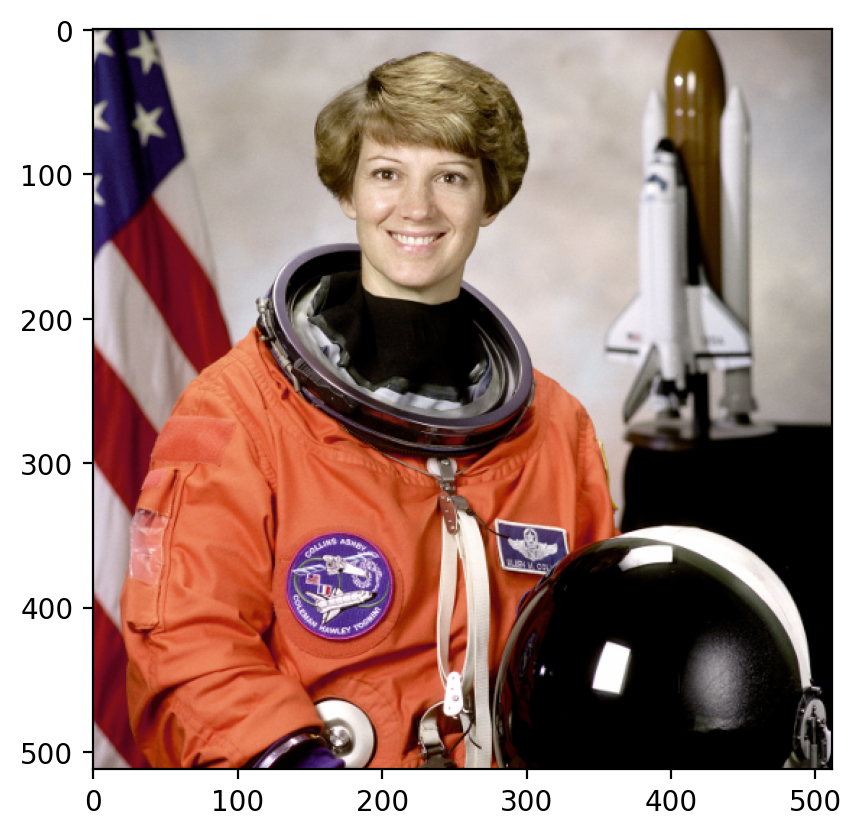

In [153]:
plt.imshow(original_images[1])

In [151]:
images[1].swapaxes(0, -1).shape

torch.Size([224, 224, 3])

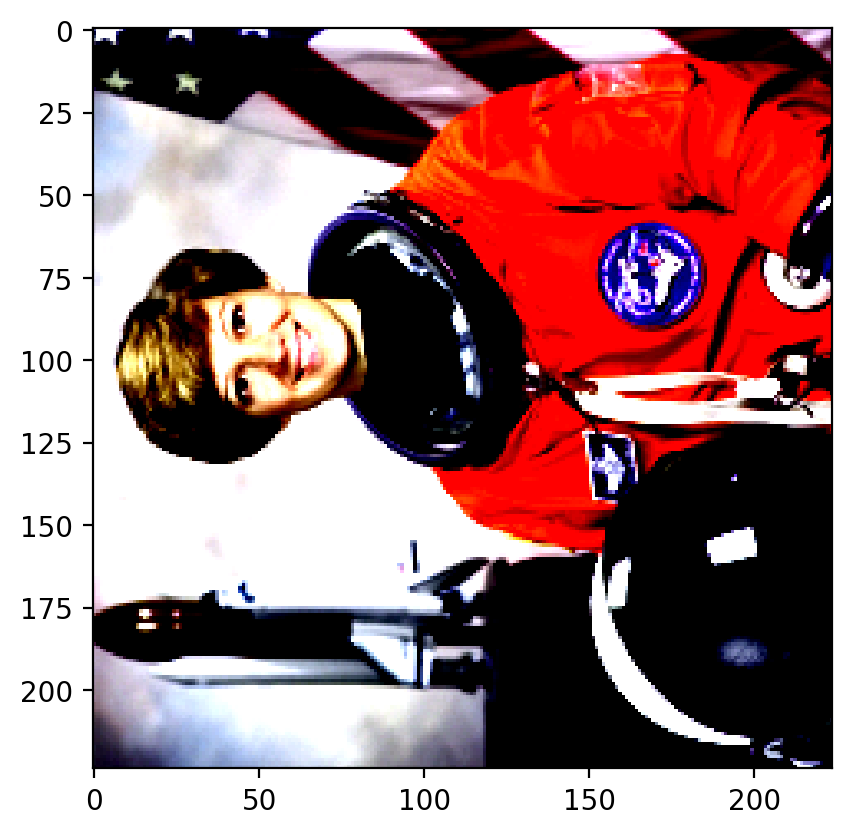

In [150]:
plt.imshow(images[1].swapaxes(0, -1))

## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [126]:
image_input = torch.tensor(np.stack(images)).to(device)

text_tokens = clip.tokenize(["This is " + desc for desc in texts]).to(device)

In [127]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

In [128]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

Text(0.5, 1.0, 'Cosine similarity between text and image features')

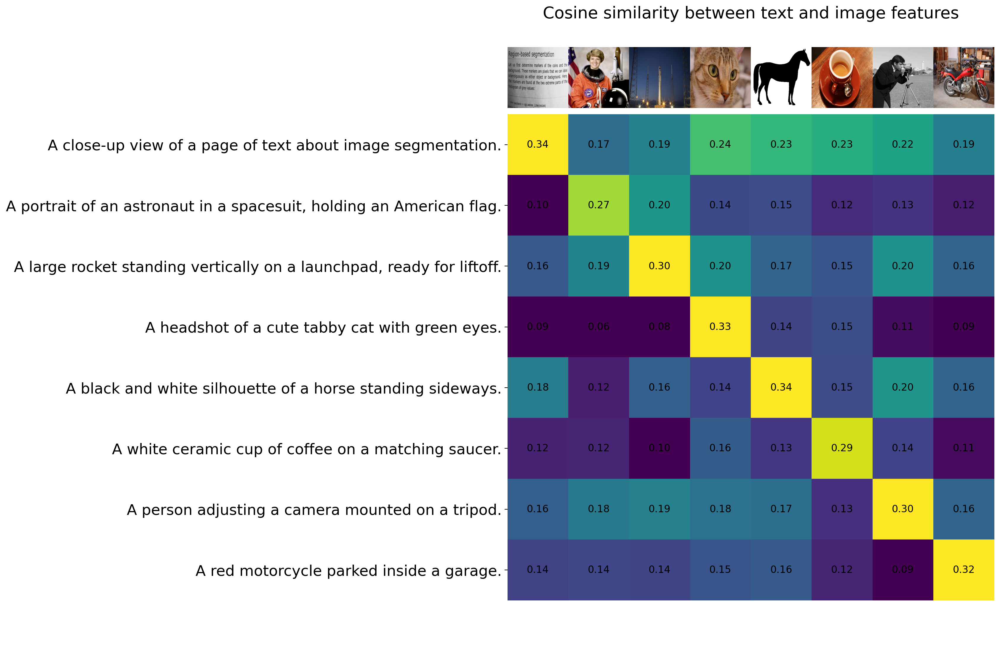

In [129]:
count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)

plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=20)

The descriptions we provided somewhat relate to each image but could be more precise.

**Question** Can you find better ways to describe some of the images and verify that this leads to better CLIP alignment? You can re-use the previous code.

In [ ]:
# Your code here!




In [18]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Textual descriptions we are going to try to match with images
descriptions = [
    "A close-up view of a page of text about image segmentation.",
    "A portrait of an astronaut in a spacesuit, holding an American flag.",
    "A large rocket standing vertically on a launchpad, ready for liftoff.",
    "A headshot of a cute tabby cat with green eyes.",
    "A black and white silhouette of a horse standing sideways.",
    "A white ceramic cup of coffee on a matching saucer.",
    "A person adjusting a camera mounted on a tripod.",
    "A red motorcycle parked inside a garage.",
]

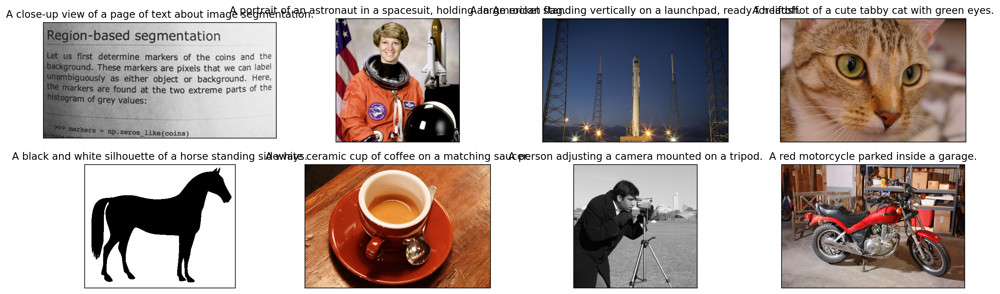

In [19]:
original_images = [
    Image.fromarray(skimage.data.page()).convert('RGB'),
    Image.fromarray(skimage.data.astronaut()),
    Image.fromarray(skimage.data.rocket()),
    Image.fromarray(skimage.data.chelsea()),
    Image.fromarray(skimage.data.horse()),
    Image.fromarray(skimage.data.coffee()),
    Image.fromarray(skimage.data.camera()).convert('RGB'),
    Image.fromarray(skimage.data.stereo_motorcycle()[0]),
    ]

images = []
texts = []
plt.figure(figsize=(16, 5))

for i, original_image in enumerate(original_images):
    plt.subplot(2, 4, i + 1)
    plt.imshow(original_image)
    plt.title(descriptions[i])
    plt.xticks([])
    plt.yticks([])

    images.append(preprocess(original_image))
    texts.append(descriptions[i])

plt.tight_layout()


In [20]:
image_input = torch.tensor(np.stack(images)).to(device)
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).to(device)

In [21]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

In [22]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

Text(0.5, 1.0, 'Cosine similarity between text and image features')

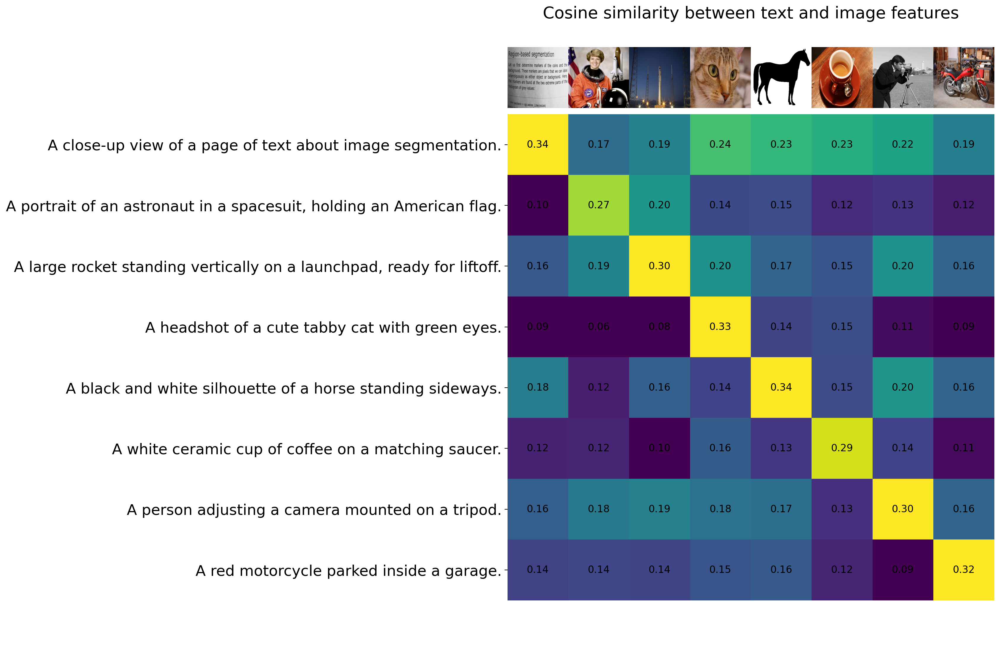

In [23]:
count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)

plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=20)

## Classifying the images according to CIFAR100 categories

You can classify images using the cosine similarity (times 100 for temperature scaling reasons) as the logits to the softmax operation. The next few cells create descriptions for each of the 100 CIFAR100 classes.

In [130]:
from torchvision.datasets import CIFAR100

cifar100_test = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess, download=True, train=False)

test_loader = torch.utils.data.DataLoader(cifar100_test, batch_size=100, shuffle=False)

In [122]:
test_loader

In [131]:
# img, lab = next(iter(test_loader))

In [132]:
print(cifar100_test.classes)

['apple', 'aquarium_fish', 'baby', 'bear', 'beaver', 'bed', 'bee', 'beetle', 'bicycle', 'bottle', 'bowl', 'boy', 'bridge', 'bus', 'butterfly', 'camel', 'can', 'castle', 'caterpillar', 'cattle', 'chair', 'chimpanzee', 'clock', 'cloud', 'cockroach', 'couch', 'crab', 'crocodile', 'cup', 'dinosaur', 'dolphin', 'elephant', 'flatfish', 'forest', 'fox', 'girl', 'hamster', 'house', 'kangaroo', 'keyboard', 'lamp', 'lawn_mower', 'leopard', 'lion', 'lizard', 'lobster', 'man', 'maple_tree', 'motorcycle', 'mountain', 'mouse', 'mushroom', 'oak_tree', 'orange', 'orchid', 'otter', 'palm_tree', 'pear', 'pickup_truck', 'pine_tree', 'plain', 'plate', 'poppy', 'porcupine', 'possum', 'rabbit', 'raccoon', 'ray', 'road', 'rocket', 'rose', 'sea', 'seal', 'shark', 'shrew', 'skunk', 'skyscraper', 'snail', 'snake', 'spider', 'squirrel', 'streetcar', 'sunflower', 'sweet_pepper', 'table', 'tank', 'telephone', 'television', 'tiger', 'tractor', 'train', 'trout', 'tulip', 'turtle', 'wardrobe', 'whale', 'willow_tree',

In [133]:
text_descriptions = [f"This is a photo of {label}" for label in cifar100_test.classes]

text_tokens = clip.tokenize(text_descriptions).to(device)

In [134]:
text_descriptions[0]

'This is a photo of apple'

In [135]:
text_tokens[0]

tensor([49406,   589,   533,   320,  1125,   539,  3055, 49407,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0], device='cuda:0',
       dtype=torch.int32)

**Question** Compute the similarity matrix between images and text (text_probs). The existing code in the cell below will then extract the top 5 predictions and display the scores for each image.

In [154]:
# Your code here!

text_probs = None

In [155]:
# image_input = torch.tensor(np.stack(img)).to(device)
image_input = torch.tensor(np.stack(images)).to(device)

text_tokens = text_tokens.to(device)

In [156]:
len(image_input)

8

In [157]:
len(text_tokens)

100

In [158]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features_cifar100 = model.encode_text(text_tokens).float()

image_features /= image_features.norm(dim=-1, keepdim=True)
text_features_cifar100 /= text_features_cifar100.norm(dim=-1, keepdim=True)

similarity = text_features_cifar100.cpu().numpy() @ image_features.cpu().numpy().T
similarity = torch.tensor(similarity)
text_probs = torch.nn.functional.softmax(100.0 * similarity, dim=-1)

In [159]:
similarity.shape

torch.Size([100, 8])

In [160]:
torch.argmax(text_probs, dim=-1)

tensor([4, 3, 3, 3, 3, 4, 3, 3, 7, 4, 3, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 3, 4, 3,
        4, 4, 3, 3, 5, 4, 4, 4, 3, 4, 3, 3, 3, 4, 4, 4, 4, 7, 3, 4, 3, 4, 6, 3,
        7, 4, 3, 3, 3, 3, 3, 3, 4, 3, 7, 3, 4, 5, 3, 4, 3, 3, 3, 3, 4, 3, 3, 4,
        3, 4, 3, 4, 4, 3, 3, 3, 3, 3, 3, 3, 5, 3, 3, 6, 3, 3, 4, 3, 3, 3, 4, 4,
        3, 4, 1, 4])

In [161]:
# lab

In [162]:
original_images

[<PIL.Image.Image image mode=RGB size=384x191>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=640x427>,
 <PIL.Image.Image image mode=RGB size=451x300>,
 <PIL.Image.Image image mode=1 size=400x328>,
 <PIL.Image.Image image mode=RGB size=600x400>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=741x500>]

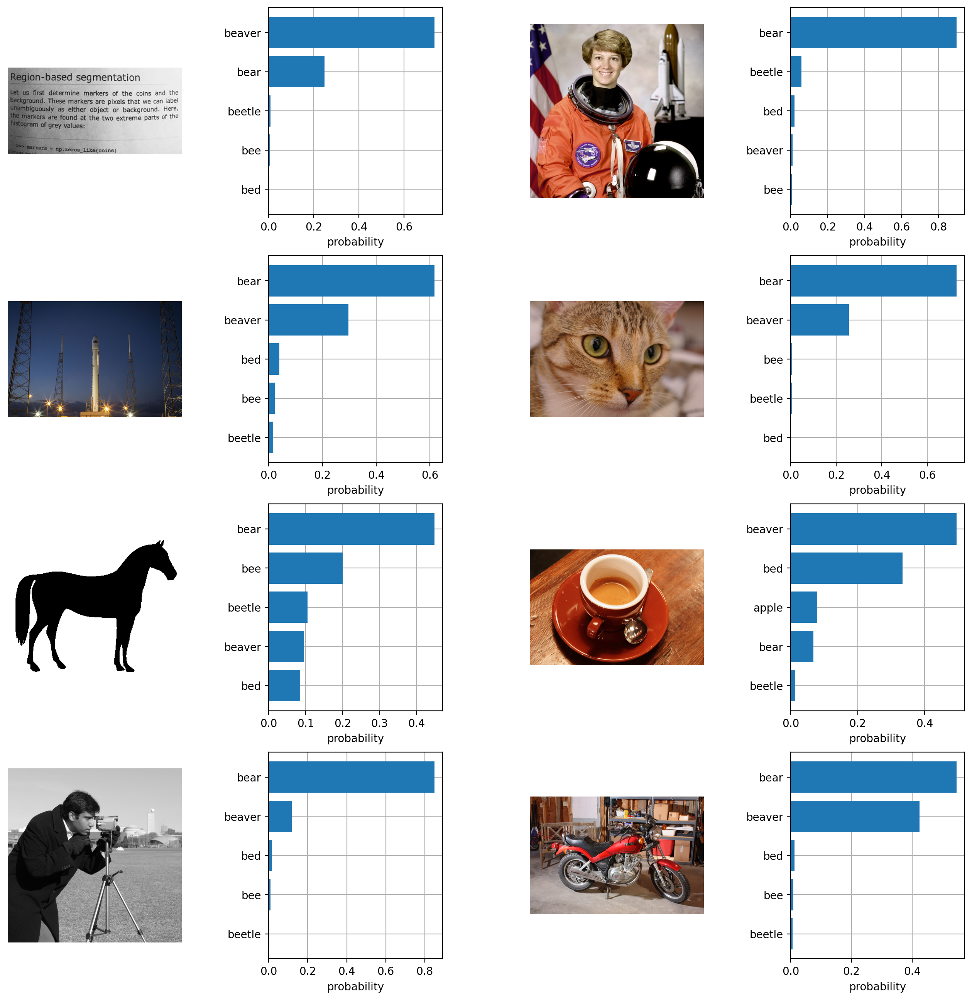

In [163]:
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

plt.figure(figsize=(16, 16))

for i, image in enumerate(original_images):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar100_test.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

# Zero-shot classification on CIFAR 10

We will now apply the lessons of the previous chapter to automatically classify the entire CIFAR10 test set!

In [ ]:
from torchvision.datasets import CIFAR10

cifar10_test = CIFAR10(os.path.expanduser("~/.cache"), transform=preprocess, download=True, train=False)

test_loader = torch.utils.data.DataLoader(cifar10_test, batch_size=100, shuffle=False)

**Question** Complete the code below to compute image features

In [ ]:
x,y = next(iter(test_loader))

with torch.no_grad():
    model.eval()

    x = x.to(device)
    y = y.to(device)

    # Your code here!
    image_features = None

**Question** Following the previous classification with CIFAR100 labels, design text prompts for each class of CIFAR10 and extract the corresponding features.

In [ ]:
# Your code here!


**Question** Compute the similarity matrix and extract the top 5 predictions

In [ ]:
# Your code here!

top_probs, top_labels = None

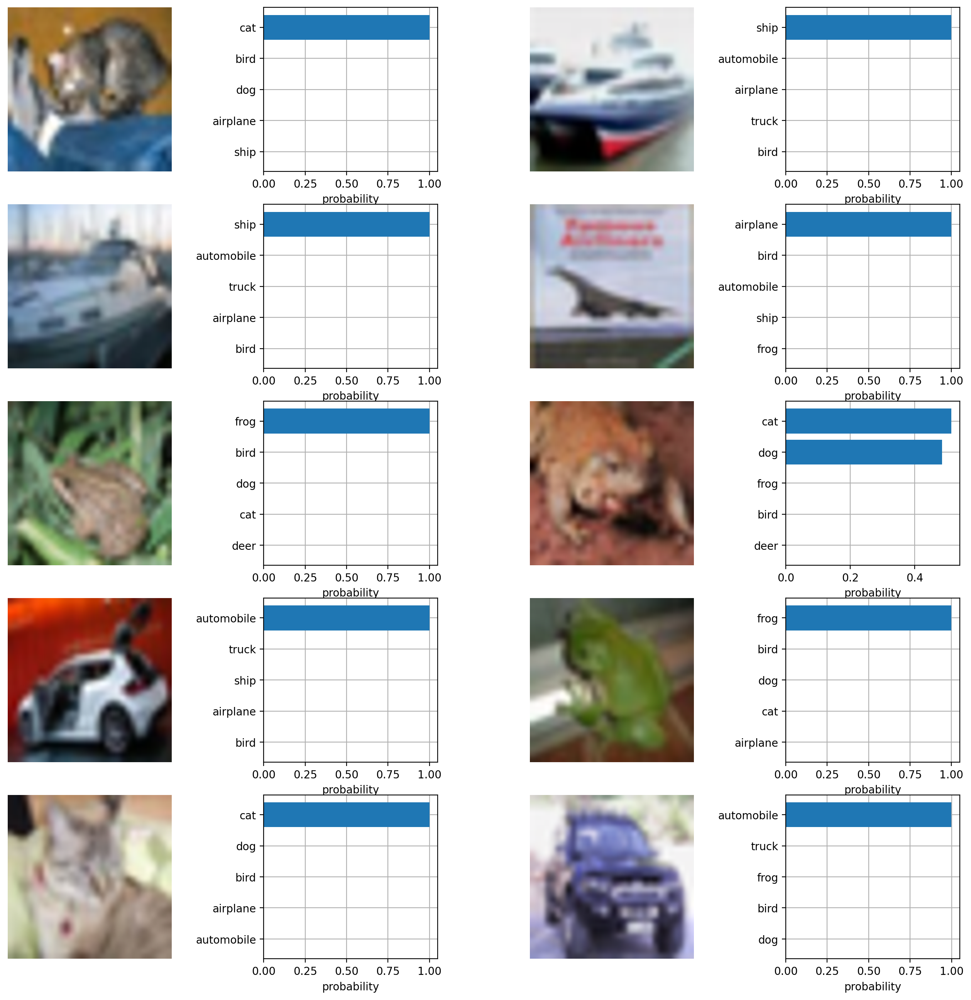

In [ ]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(x[:10]):
    plt.subplot(5, 4, 2 * i + 1)
    plt.imshow(inv_normalize(image).cpu().numpy().transpose((1,2,0)))
    plt.axis("off")

    plt.subplot(5, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar10_test.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

## Full zero shot classification of CIFAR10

We have seen how that we can easily compute the similarity matrix for a single batch, we can apply the same process for the entire test set.

**Question** Fill in the evaluation step function that will be used in the evaluation loop

In [ ]:
def eval_step(model, x, y, text_feats):
    with torch.no_grad():
        model.eval()

        x = x.to(device)
        y = y.to(device)

        # Your code here!

        # Compute features, similarity matrix and prediction



        # Compute accuracy to return




    return acc

In [ ]:
def eval_model(model, test_loader, text_feats):

    pbar = tqdm(range(len(test_loader)))

    val_loss, val_acc = 0., 0.
    for i, (x, y) in enumerate(test_loader):
        acc = eval_step(model, x, y, text_feats)
        val_acc += acc
        pbar.update()
        pbar.set_description(f"Running test accuracy: {(val_acc/(100*(i+1)))*100 :.2f}")
    pbar.close()

    return

In [ ]:
eval_model(model, test_loader, text_features)

  0%|          | 0/100 [00:00<?, ?it/s]

## Customizing the prompt

The actual text used for the label text actually has a strong influence on the final result! You can check this for yourself here.

**Question** Try to design a prompt template that significantly changes the performance of the zero-shot classification

In [ ]:
text_descriptions = [f"A photo of a {label}" for label in cifar10_test.classes]


text_tokens = clip.tokenize(text_descriptions).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

In [ ]:
eval_model(model, test_loader, text_features)

  0%|          | 0/100 [00:00<?, ?it/s]

## Ensembling different prompts

A simple way to improve classification performance is typically to aggregate the results of different classifiers. If you consider that different textual prompts lead to slightly different zero-shot classifiers, we might be able to increase the performance of classification

In [ ]:
text_templates = [
    'a photo of a {}.',
    'a blurry photo of a {}.',
    'a black and white photo of a {}.',
    'a low contrast photo of a {}.',
    'a high contrast photo of a {}.',
    'a bad photo of a {}.',
    'a good photo of a {}.',
    'a photo of a small {}.',
    'a photo of a big {}.',
    'a photo of the {}.',
    'a blurry photo of the {}.',
    'a black and white photo of the {}.',
    'a low contrast photo of the {}.',
    'a high contrast photo of the {}.',
    'a bad photo of the {}.',
    'a good photo of the {}.',
    'a photo of the small {}.',
    'a photo of the big {}.',
]


**Question** Complete the code below to extract features for each of the template types

In [ ]:
# You code here!

text_features_list = []

for text_template in text_templates:

    # Compute text features

    text_features_list.append(text_features)

**Question** Complete the evaluation step function to accomodate a list of different textual prompts to aggregate.

In [ ]:
def eval_step_textlist(model, x, y, text_feats_list):
    with torch.no_grad():
        model.eval()

        x = x.to(device)
        y = y.to(device)

        image_feats = model.encode_image(x).float()

        # Your code here!



        _, preds = text_probs.topk(1, dim=-1)

        acc = (y==preds[:,0]).float().sum()

    return acc

In [ ]:
def eval_model_textlist(model, test_loader, text_feats_list, fraction=1):

    pbar = tqdm(range(len(test_loader)))

    val_loss, val_acc = 0., 0.
    for i, (x, y) in enumerate(test_loader):
        acc = eval_step_textlist(model, x, y, text_feats_list)
        val_acc += acc
        pbar.update()
        pbar.set_description(f"Running test accuracy: {(val_acc/(100*(i+1)))*100 :.2f}")
    pbar.close()

    return

In [ ]:
eval_model_textlist(model, test_loader, text_features_list, fraction=1)

  0%|          | 0/100 [00:00<?, ?it/s]

## Test Time Adaptation with augmented images

We can take a page out of the Zero framework developped by this Elisa Ricci (this morning's speaker!) to investigate another avenue of improvement for the classification. We have previously created variants of the textual prompt to get multiple predictions.

Zero proposes (among other things we are not going to implement) to create variants of the image using data augmentation. The following transform can be used to apply random augmentations to the original CIFAR10 images.


In [ ]:
augment_transform = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
])

**Question** Create a transform function that takes as input a CIFAR10 image and outputs a list of different random augmentations of this image. Hint: torchvision's transforms API allows you to perform custom transformation with transforms.Lambda!

In [ ]:
# Your code here!

multi_view_transform = None

In [ ]:
cifar10_test_multi = CIFAR10(os.path.expanduser("~/.cache"), transform=multi_view_transform, download=True, train=False)

test_loader_multi = torch.utils.data.DataLoader(cifar10_test_multi, batch_size=100, shuffle=False)

**Question** Complete the evaluation step for a function that uses a list of augmented images

In [ ]:
def eval_step_auglist(model, x_list, y, text_feats):
    with torch.no_grad():
        model.eval()
        x = torch.stack(x_list).to(device)
        y = y.to(device)

        # Your code here!



        _, preds = text_probs.topk(1, dim=-1)

        acc = (y==preds[:,0]).float().sum()

    return acc

In [ ]:
def eval_model_auglist(model, test_loader, text_feats):

    pbar = tqdm(range(len(test_loader)))

    val_loss, val_acc = 0., 0.
    for i, (x_list, y) in enumerate(test_loader):

        acc = eval_step_auglist(model, x_list, y, text_feats)
        val_acc += acc

        pbar.update()
        pbar.set_description(f"Running test accuracy: {(val_acc/(100*(i+1)))*100 :.2f}")

    pbar.close()

    return

In [ ]:
eval_model_auglist(model, test_loader_multi, text_features)

  0%|          | 0/100 [00:00<?, ?it/s]

# Towards Few Shot Learning with a few labeled image embeddings

We have now seen that we can perform CIFAR10 classification without modifying the CLIP neural networks and without even having access to labeled images.

We are now going to look at another common situation: we have access to a few CIFAR10 images with their label (let's say 160).

In [ ]:
cifar10_train = CIFAR10(os.path.expanduser("~/.cache"), transform=preprocess, download=True, train=True)

train_loader = torch.utils.data.DataLoader(cifar10_train, batch_size=160, shuffle=False)

images_coreset, labels_coreset = next(iter(train_loader))

## Using the available labeled images to estimate a typical class embedding

A first approach is to simply use the available labeled samples to get a "typical" or "average" CLIP embedding of images in a given class.

**Question** Complete the code below to compute CLIP representations of the 160 available training images, and use them to compute the average CLIP image embedding for each of the 10 available classes.

In [ ]:
# Your code here

images_coreset = images_coreset.to(device)

image_feats_coreset = model.encode_image(images_coreset).float()

exemplar_feats_coreset_list = [0 for _ in range(10)]
counts_coreset_list = [0 for _ in range(10)]

for i in range(len(images_coreset)):
    # Compute the typical image embedding for each class

exemplar_feats = torch.stack(exemplar_feats_coreset_list)

**Question** Complete the evaluation loop function to combine the "average" embedding with text based feature prediction. Careful, the "average" embeddings we have are quite bad due to the limited amount of data, you might want to avoid relying on them too much.

In [ ]:
def eval_step_exemplar(model, x, y, text_feats, exemplar_feats):
    with torch.no_grad():
        model.eval()

        x = x.to(device)
        y = y.to(device)

        # You code here!

        _, preds = text_probs.topk(1, dim=-1)

        acc = (y==preds[:,0]).float().sum()

    return acc

In [ ]:
def eval_model_exemplar(model, test_loader, text_feats, exemplar_feats):

    pbar = tqdm(range(len(test_loader)))

    val_loss, val_acc = 0., 0.
    for i, (x, y) in enumerate(test_loader):
        acc = eval_step_exemplar(model, x, y, text_feats, exemplar_feats)
        val_acc += acc
        pbar.update()
        pbar.set_description(f"Running test accuracy: {(val_acc/(100*(i+1)))*100 :.2f}")
    pbar.close()

    return

In [ ]:
eval_model_exemplar(model, test_loader, text_features, exemplar_feats)

  0%|          | 0/100 [00:00<?, ?it/s]

## Tuning text prompts

We can also to try a minimal amount of classifier weights on the limited training data we have. In fact, this is what the second stage of Elisa Ricci's 2SFS framework does!

We optimize a set of learned text embeddings, initializing them from the textual prompt features we normally we use. We are going to use the available training data to refine these embeddings to account for additional information

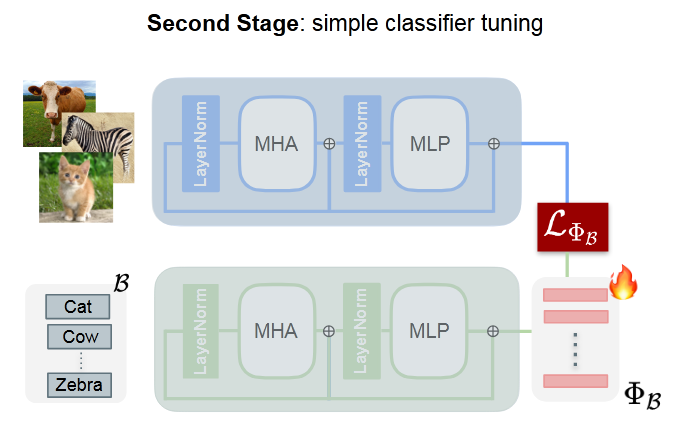

The cell below shows you how to create trainable text embeddings and track them in a pytorch optimizer:

In [ ]:
learnable_text_features = text_features.clone()
learnable_text_features.requires_grad = True

optimizer = torch.optim.AdamW([learnable_text_features], lr=1e-4, weight_decay=0.01)

**Question** Complete the training step function to optimize the learnable text features

In [ ]:
def train_step_learntext(model, x, y, learnable_text_feats, optim):
    with torch.no_grad():
        model.eval()

        x = x.to(device)
        y = y.to(device)

        # Your code here!



    _, preds = text_probs.topk(1, dim=-1)

    acc = (y==preds[:,0]).float().mean()

    return loss, acc

In [ ]:
def train_model_learntext(model, x, y, learnable_text_feats, optim, iterations):

    pbar = tqdm(range(iterations))

    val_loss, val_acc = 0., 0.
    for i in range(iterations):
      loss, acc = train_step_learntext(model, x, y, learnable_text_feats, optim)
      val_loss += loss
      val_acc += acc
      pbar.update()
      pbar.set_description(f"Running train loss: {val_loss/(i+1) :.2f}, Running train accuracy: {val_acc/(i+1)*100 :.2f}")
    pbar.close()

    return

In [ ]:
train_model_learntext(model, images_coreset, labels_coreset, learnable_text_features, optimizer, iterations=500)

  0%|          | 0/500 [00:00<?, ?it/s]

Once we have "better" text embeddings, we can check if they truly do improve our results:

In [ ]:
eval_model(model, test_loader, learnable_text_features)

  0%|          | 0/100 [00:00<?, ?it/s]